In [1]:
## Hierarchy clusterization

In [38]:
# utils
import time
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# Models
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans
from sklearn.utils import shuffle
from sklearn.model_selection import GridSearchCV, KFold
# metrics
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import v_measure_score

from kneed import KneeLocator

In [28]:
# Images of 13,611 grains of 7 different registered dry beans were taken with a high-resolution camera. A total of 16 features; 12 dimensions and 4 shape forms, were obtained from the grains.	
# https://archive.ics.uci.edu/ml/datasets/Dry+Bean+Dataset
#1.) Area (A): The area of a bean zone and the number of pixels within its boundaries.
#2.) Perimeter (P): Bean circumference is defined as the length of its border.
#3.) Major axis length (L): The distance between the ends of the longest line that can be drawn from a bean.
#4.) Minor axis length (l): The longest line that can be drawn from the bean while standing perpendicular to the main axis.
#5.) Aspect ratio (K): Defines the relationship between L and l.
#6.) Eccentricity (Ec): Eccentricity of the ellipse having the same moments as the region.
#7.) Convex area (C): Number of pixels in the smallest convex polygon that can contain the area of a bean seed.
#8.) Equivalent diameter (Ed): The diameter of a circle having the same area as a bean seed area.
#9.) Extent (Ex): The ratio of the pixels in the bounding box to the bean area.
#10.)Solidity (S): Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.
#11.)Roundness (R): Calculated with the following formula: (4piA)/(P^2)
#12.)Compactness (CO): Measures the roundness of an object: Ed/L
#13.)ShapeFactor1 (SF1)
#14.)ShapeFactor2 (SF2)
#15.)ShapeFactor3 (SF3)
#16.)ShapeFactor4 (SF4)
#17.)Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira) 7 classes
df2 = pd.read_csv('Dry_Bean_Dataset.csv',sep=';',decimal=",")
df2 = df2.dropna()
annotations2 = pd.Categorical(df2.iloc[:,-1]).codes
data2 = df2.iloc[:,0:-1]
data2.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166


hierarchy.dendrogram

In [7]:
Z = linkage(data2, 'ward')
#  Ward variance minimization algorithm. 

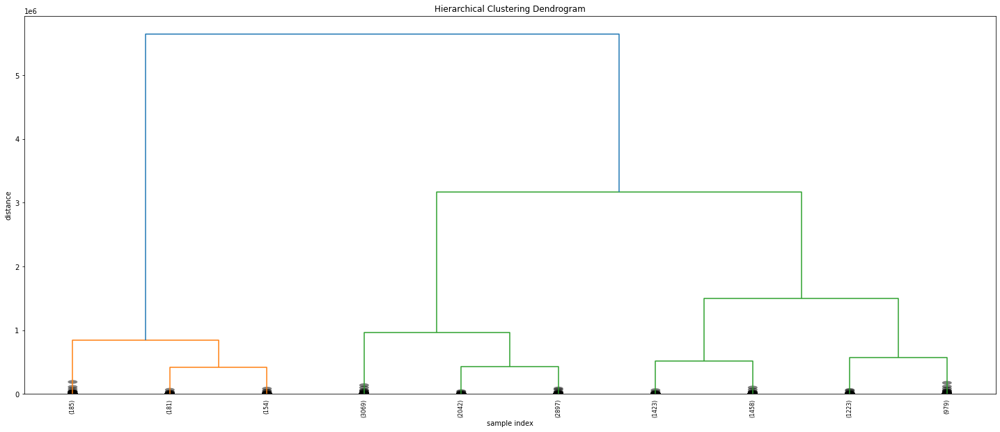

In [9]:
# calculate full dendrogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=10,  # show only the last p merged clusters
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
    show_contracted=True,  # to get a distribution impression in truncated branches
)
plt.show()
# On the x axis you see labels. If you don't specify anything else they are the indices of your samples in X.
# On the y axis you see the distances (of the 'ward' method in our case).

use another clusterization method

In [12]:
# Train kmeans
kmeans = KMeans(n_clusters=7, random_state=0).fit(Xtrain)

In [12]:
# test kmeans
pred = kmeans.predict(Xtrain.reshape(-1, 16))
print('rand_score: ', np.round(adjusted_rand_score(pred, Ytrain),3))
print('v_measure_score: ', np.round(v_measure_score(pred, Ytrain),3))

rand_score:  0.662
v_measure_score:  0.71


hyper parameters turning

In [18]:
start_exec_time = time.time()
model = KMeans()
# определяем диапазон параметров для поиска
score_method = 'v_measure_score'
grid_params = [
    {'n_clusters': np.arange(2,15)},
]

g_search = GridSearchCV(
    estimator=model,
    param_grid=grid_params,
    scoring= score_method, # The V-measure is the harmonic mean between homogeneity and completeness
    cv=5, # cross validation
    n_jobs=3 # multi thread
)

_ = g_search.fit(Xtrain, Ytrain) # запуск поиска оптимальных параметров
# демонстрация работы классификатора на оптимальных параметрах
model = KMeans(n_clusters=g_search.best_params_['n_clusters']).fit(Xtrain)
pred = model.predict(Xtest.reshape(-1, 16))
print('Results:', g_search.best_params_ )
print('rand_score: ', np.round(adjusted_rand_score(pred, Ytest),3))
print('v_measure_score: ', np.round(v_measure_score(pred, Ytest),3))
print("Time of execution:",time.time() - start_exec_time)


Results: {'n_clusters': 8}
rand_score:  0.713
v_measure_score:  0.741
Time of execution: 9.610479831695557


find optimal point (optimal K value)

Text(0, 0.5, 'v_measure_score')

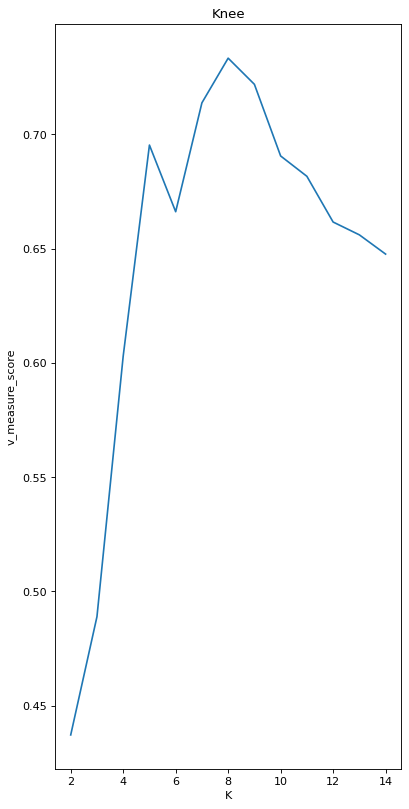

In [19]:
# visualise knee 
fig, axs = plt.subplots(1, 1, constrained_layout=True,figsize=(5, 10), dpi=80)
axs.plot(g_search.cv_results_['param_n_clusters'].data, g_search.cv_results_['mean_test_score'])
axs.set_title("Knee")
axs.set_xlabel('K')
axs.set_ylabel(score_method)

In [20]:
# find optimums
X = list(g_search.cv_results_['param_n_clusters'].data)
Y = list(g_search.cv_results_['mean_test_score'])
K_optimum = KneeLocator(X,Y, curve='concave').knee # searh knee point
print("OPTIMAL K values:")
print(K_optimum)

OPTIMAL K values:
5


Visualisation with PCA method

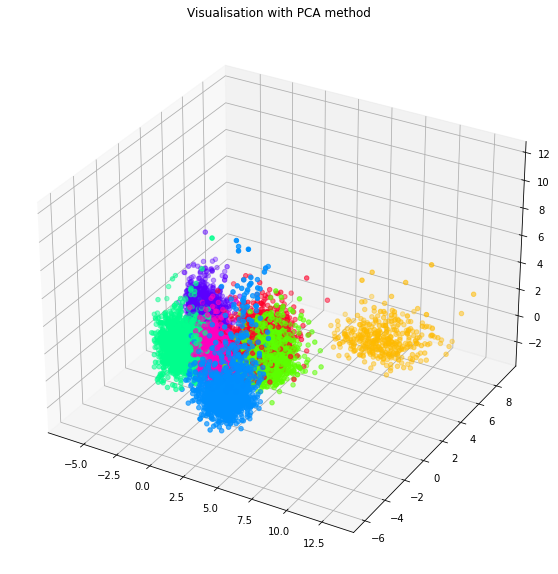

In [14]:
from sklearn import decomposition
pca = decomposition.PCA(n_components=3)
pca.fit(Xtrain)
X = pca.transform(Xtrain)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection='3d')
ax.set_title("Visualisation with PCA method")
ax.scatter(X[:, 0], X[:, 1],X[:, 2], c = Ytrain, cmap=plt.cm.gist_rainbow)

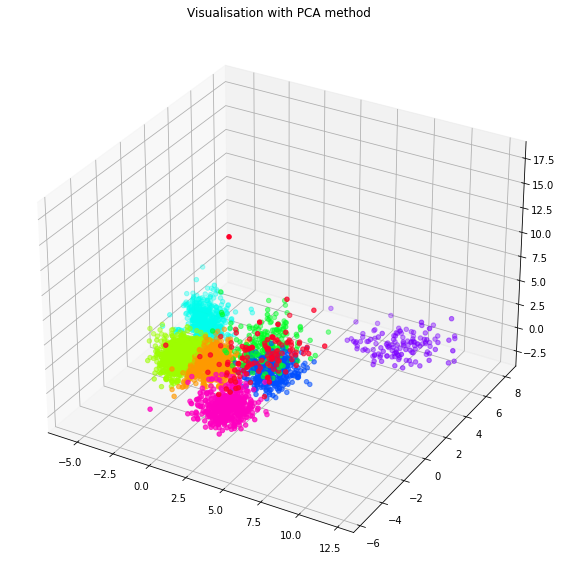

In [22]:
from sklearn import decomposition
pca = decomposition.PCA(n_components=3)
pca.fit(Xtrain)
X = pca.transform(Xtest)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection='3d')
ax.set_title("Visualisation with PCA method")
ax.scatter(X[:, 0], X[:, 1],X[:, 2], c = pred, cmap=plt.cm.gist_rainbow)